In [1]:
import scanpy as sc
import pandas as pd
import scvelo as scv
import cellrank as cr
import ehrapy as ep
import numpy as np
import matplotlib.pyplot as plt
import ehrapy as ep

Installed version 0.3.0 of ehrapy is outdated. Newest version is 0.4.0!

In [2]:
from diabetic_retinopathy.latent_extractors.predictors.utils import (
    Stage,
    FinishCallback,
    NNModel,
)
from diabetic_retinopathy.constants import MODELS_DIR, RESULTS_DIR
from diabetic_retinopathy.latent_extractors.predictors.models.LatentExtractor import (
    Models as SpatialSSLModels,
)

# from diabetic_retinopathy.latent_extractors.predictors.utils import Stage

In [3]:
palette = {
    "Normal": "yellowgreen",
    "Mild": "darkorange",
    "Medium": "mediumturquoise",
    "Severe": "red",
    "Proliferative": "purple",
}

In [4]:
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    print(model)

ViTHF
VanModel
resnet18ImgNet
resnet34ImgNet
resnet50ImgNet
resnet50HistDINO
ViTHistDINO


In [5]:
adata_dicts = {}
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    filepath = RESULTS_DIR / model / "latents-test.csv"
    columns_obs_only_ = ["gt_class", "gt_class_decoded"]
    id_col = "id"

    adata_dicts[model] = ep.io.read_csv(
        filepath, index_column=id_col, columns_obs_only=columns_obs_only_
    )
    print(model)

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:14,745 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `768`.
ViTHF


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:16,146 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `512`.
VanModel


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:17,480 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `512`.
resnet18ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:18,804 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `512`.
resnet34ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:24,761 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `2048`.
resnet50ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:30,036 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `2048`.
resnet50HistDINO


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 09:24:31,135 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `9194` x `384`.
ViTHistDINO


In [6]:
def show_adata(adata, palette=palette):
    print(adata.obs.gt_class_decoded.value_counts())
    ep.pp.pca(adata)
    ep.pp.neighbors(adata)

    # UMAP
    ep.tl.umap(adata)
    ep.pl.pca(adata, color=["gt_class_decoded"], palette=palette)
    ep.pl.umap(adata, color=["gt_class_decoded"], palette=palette)
    return adata

In [16]:
import numpy as np
from cellrank.tl.kernels import ConnectivityKernel
from cellrank.tl.kernels import PseudotimeKernel


def show_adata_nonstandart(adata, palette=palette):

    # ep.tl.leiden(adata)
    # ep.tl.paga(adata)
    # ep.pl.paga(adata)

    ep.pp.pca(adata)
    ep.pp.neighbors(adata)
    ep.tl.umap(adata)
    ep.pl.umap(adata, color="gt_class_decoded")

    adata.uns["iroot"] = np.flatnonzero(adata.obs["gt_class_decoded"] == "Normal")[10]
    ep.tl.dpt(adata)
    pk = PseudotimeKernel(adata)
    pk.compute_transition_matrix(threshold_scheme="soft")

    pk.compute_projection(basis="umap")
    scv.pl.velocity_embedding_stream(
        adata, vkey="T_fwd", basis="umap", color="gt_class_decoded", density=0.5
    )

________________________________________________
ViTHF
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


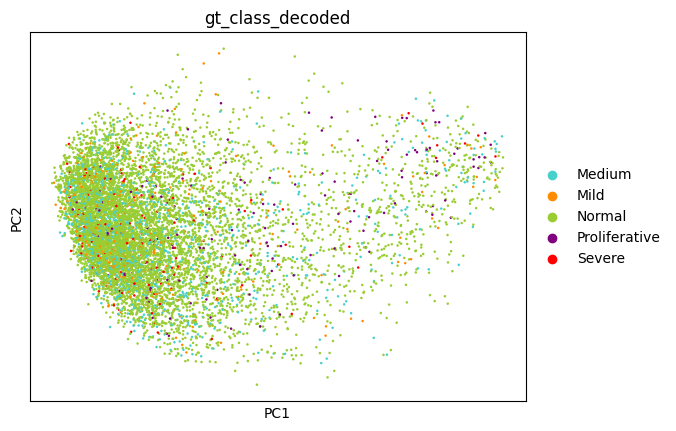

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


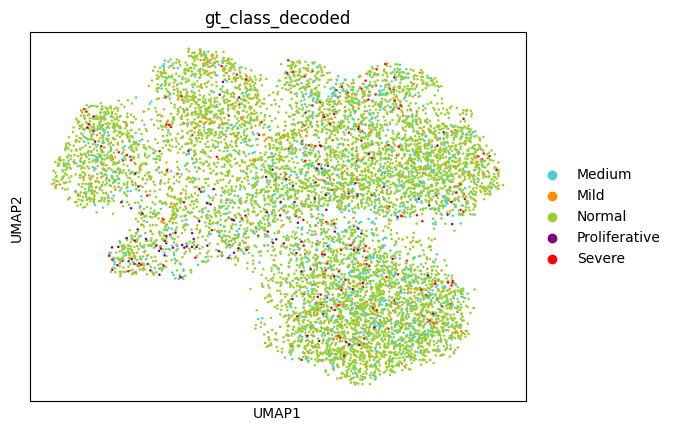

________________________________________________
________________________________________________
VanModel
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


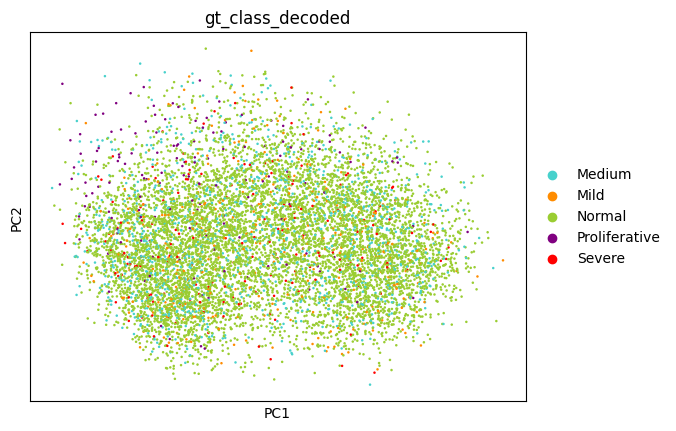

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


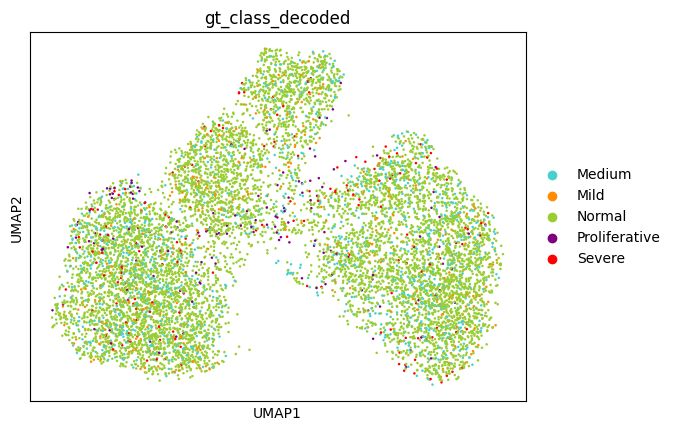

________________________________________________
________________________________________________
resnet18ImgNet
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


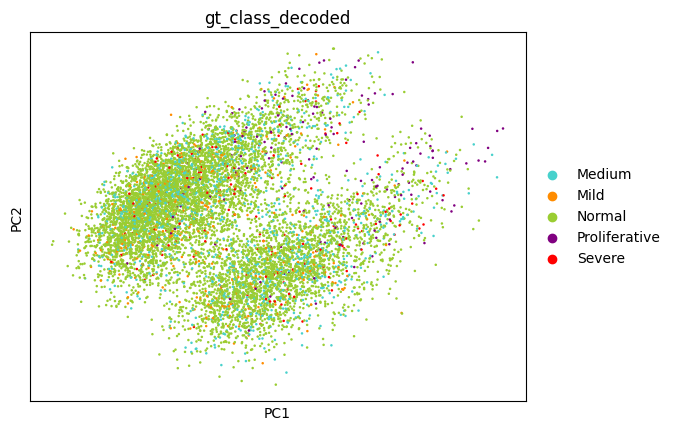

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


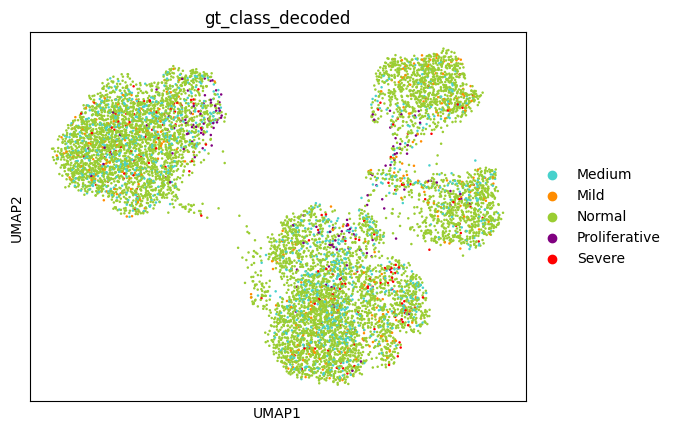

________________________________________________
________________________________________________
resnet34ImgNet
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


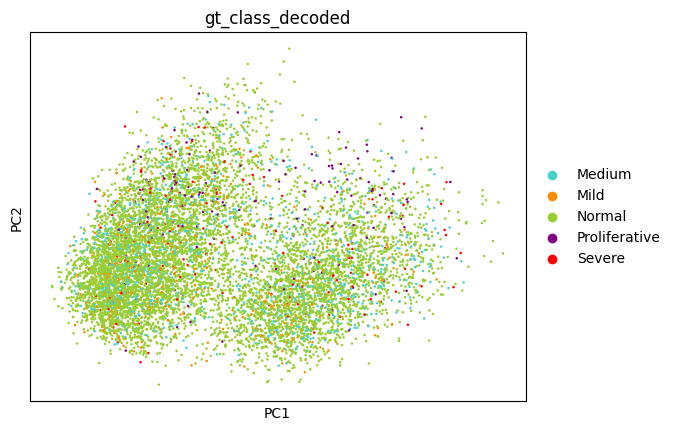

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


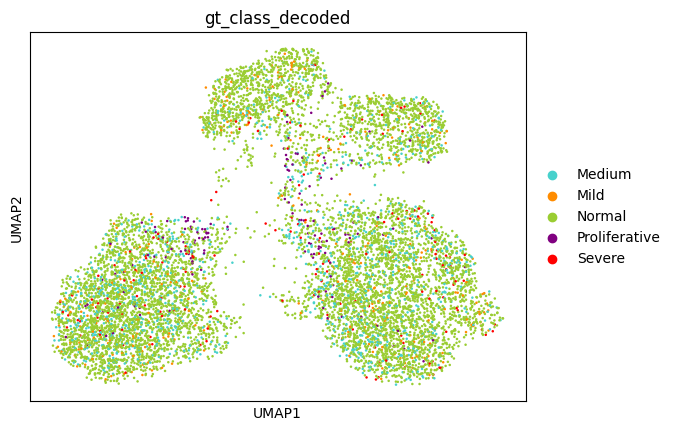

________________________________________________
________________________________________________
resnet50ImgNet
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


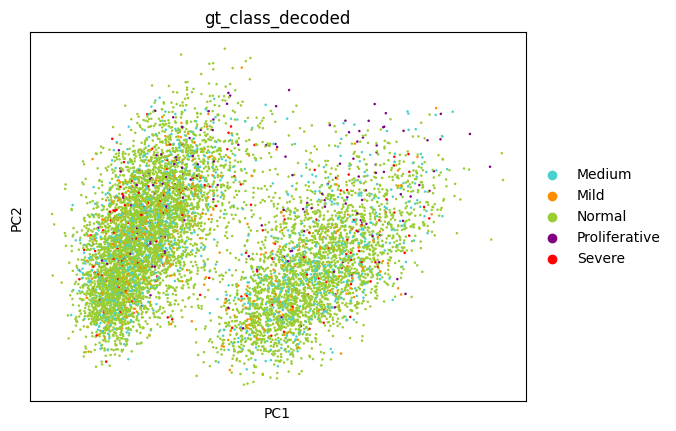

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


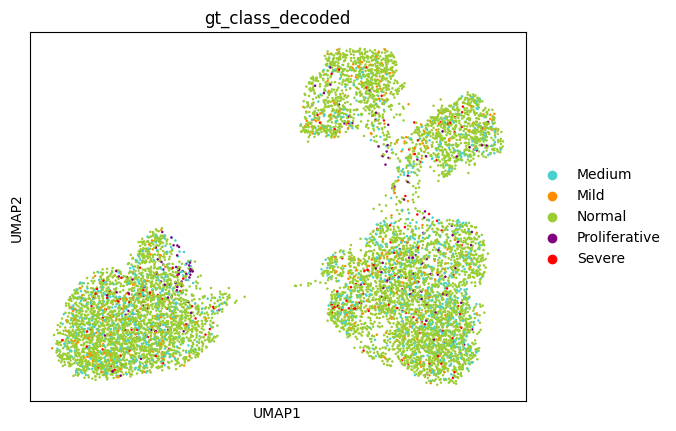

________________________________________________
________________________________________________
resnet50HistDINO
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


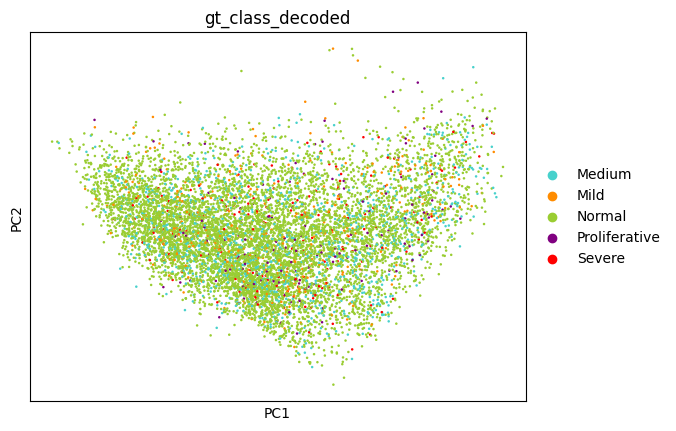

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


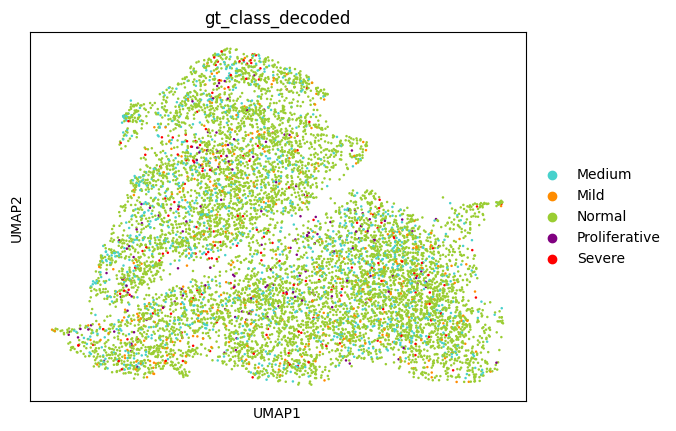

________________________________________________
________________________________________________
ViTHistDINO
gt_class_decoded
Normal           7294
Medium           1198
Mild              360
Severe            184
Proliferative     158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


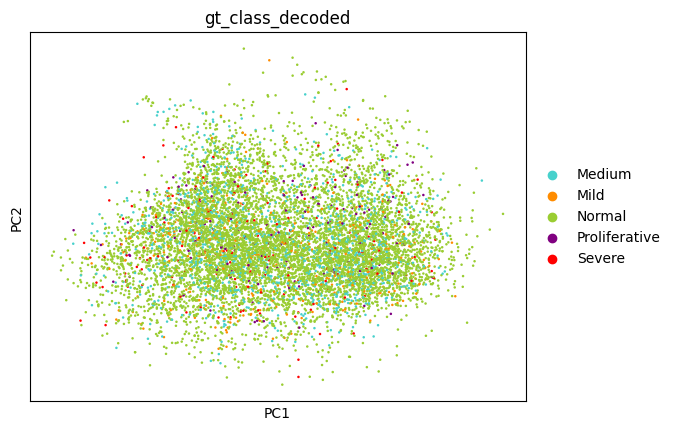

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


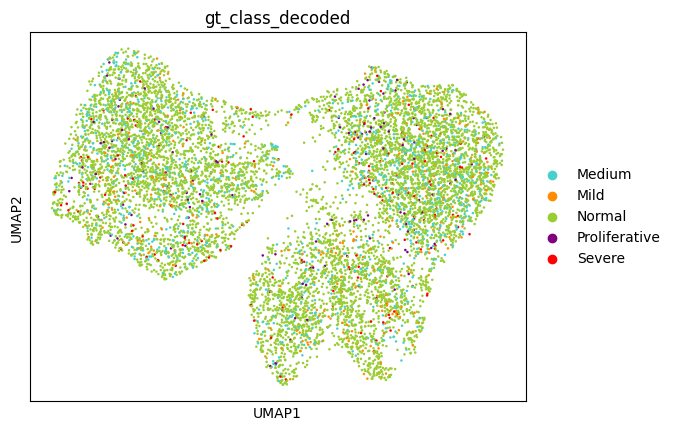

________________________________________________


In [18]:
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    print("________________________________________________")
    print(model)
    adata_dicts[model] = show_adata(adata_dicts[model])
    print("________________________________________________")

________________________________________________
ViTHF


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


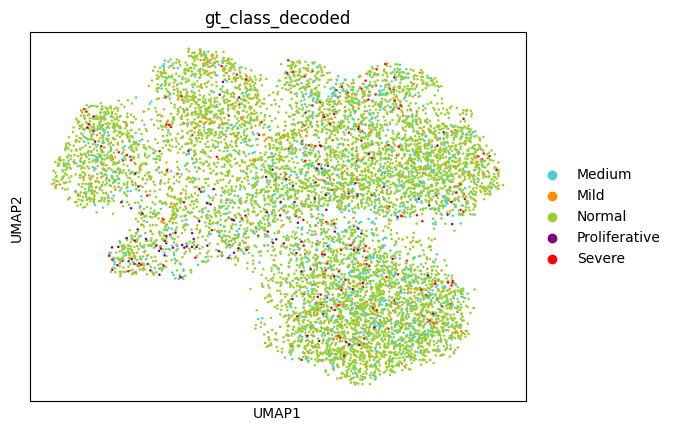

  0%|          | 0/9194 [00:00<?, ?cell/s]

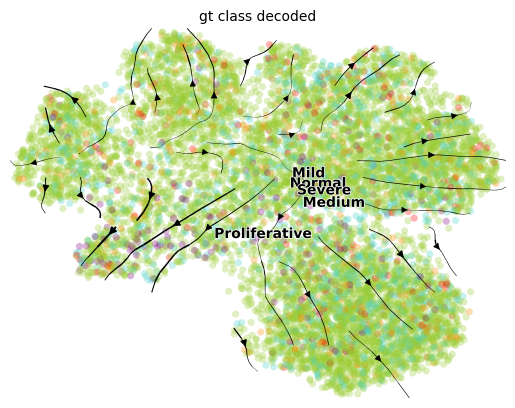

________________________________________________
________________________________________________
VanModel


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


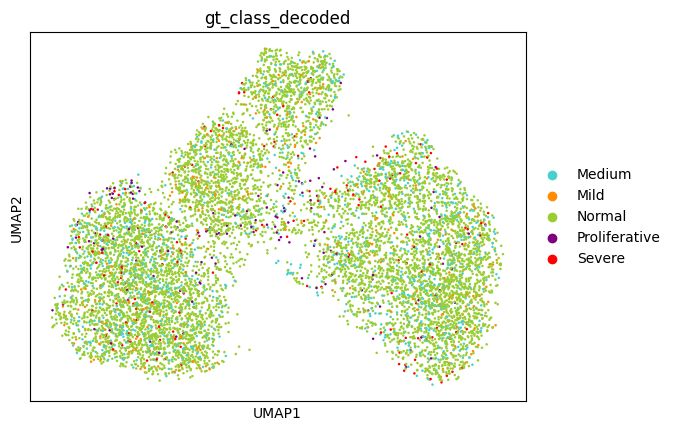

  0%|          | 0/9194 [00:00<?, ?cell/s]

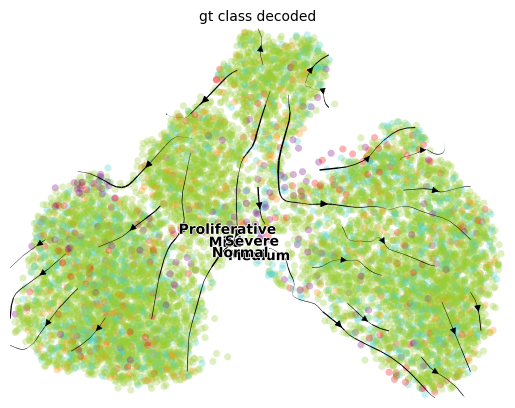

________________________________________________
________________________________________________
resnet18ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


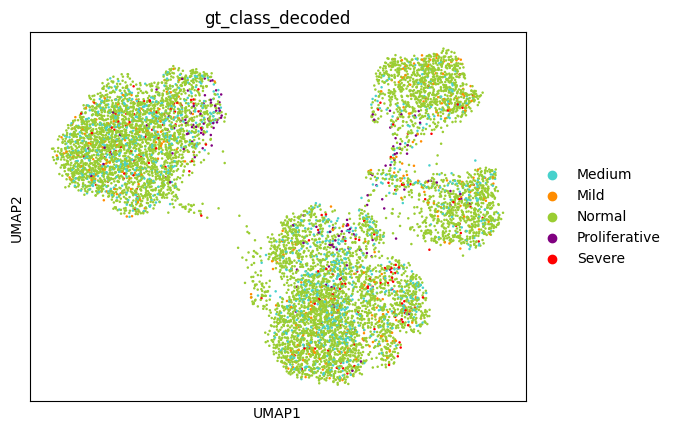

  0%|          | 0/9194 [00:00<?, ?cell/s]

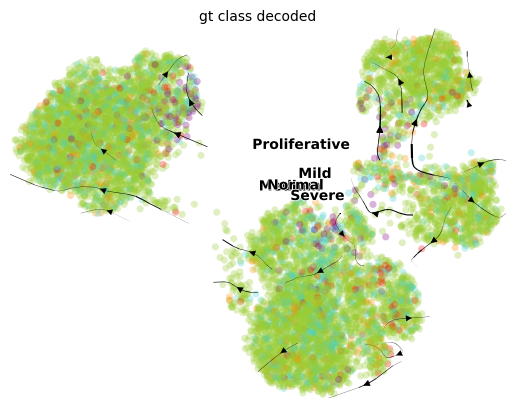

________________________________________________
________________________________________________
resnet34ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


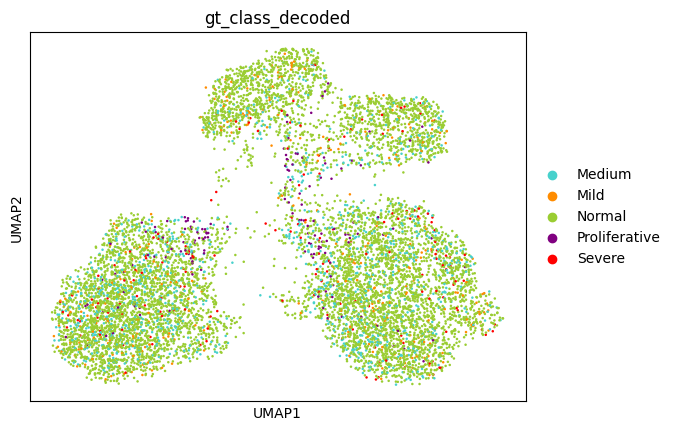

  0%|          | 0/9194 [00:00<?, ?cell/s]

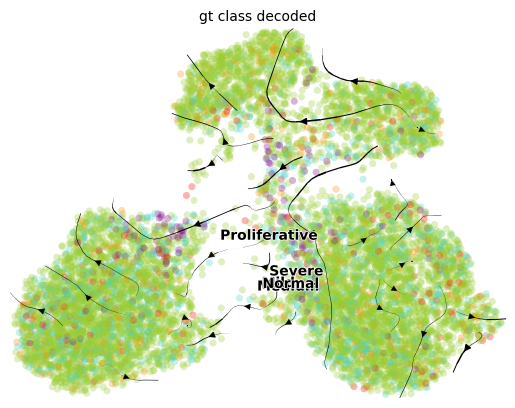

________________________________________________
________________________________________________
resnet50ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


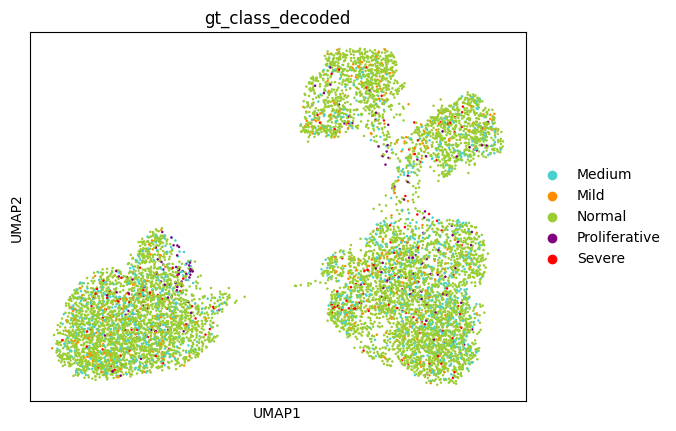

  0%|          | 0/9194 [00:00<?, ?cell/s]

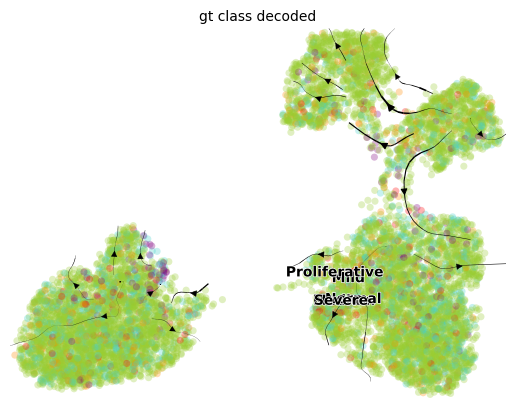

________________________________________________
________________________________________________
resnet50HistDINO


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


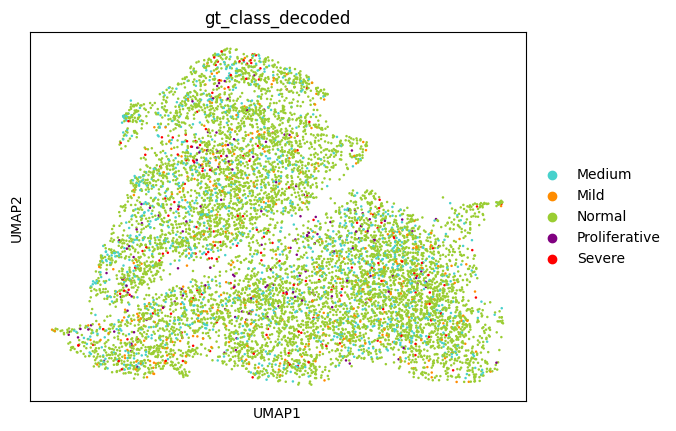

  0%|          | 0/9194 [00:00<?, ?cell/s]

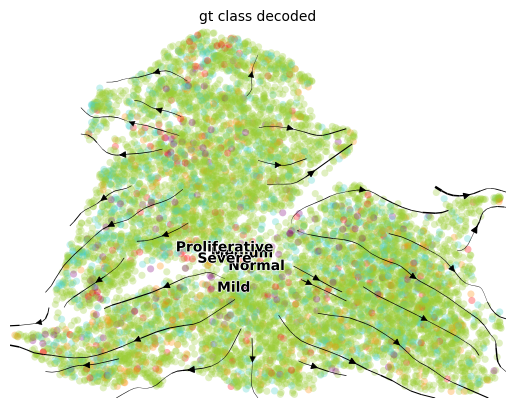

________________________________________________
________________________________________________
ViTHistDINO


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


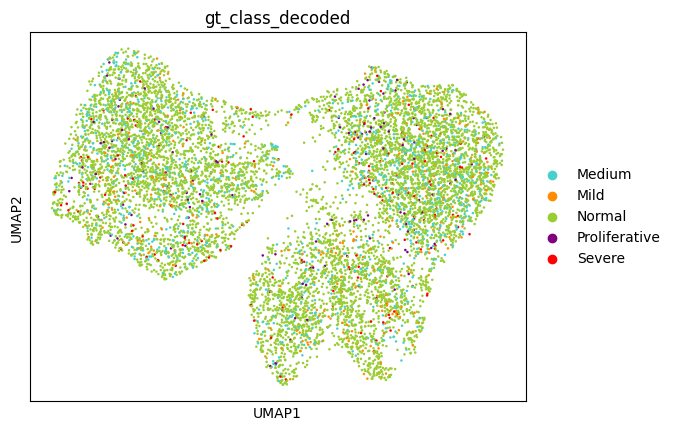

  0%|          | 0/9194 [00:00<?, ?cell/s]

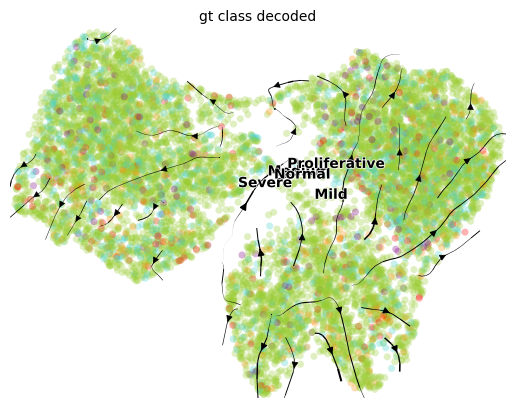

________________________________________________


In [19]:
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    print("________________________________________________")
    print(model)
    show_adata_nonstandart(adata_dicts[model])
    print("________________________________________________")

# Undersampling to have even classes

In [20]:
def get_undersampled_adata(df):
    val_counts = pd.DataFrame(df.gt_class_decoded.value_counts())
    min_size = val_counts["count"].min()
    undersampled = []
    for name, group in df.groupby("gt_class_decoded"):
        if group.shape[0] > min_size:
            undersampled.append(group.sample(min_size))
        else:
            undersampled.append(group)
    undersampled_df = pd.concat(undersampled, ignore_index=True)
    return undersampled_df


import tempfile


def get_adata_from_df(df, columns_obs_only, index_column):
    with tempfile.NamedTemporaryFile(mode="w", suffix=".csv") as temp:
        df.to_csv(temp.name, index=False)
        temp.seek(0)
        adata = ep.io.read_csv(
            temp.name, index_column=index_column, columns_obs_only=columns_obs_only
        )
        temp_filepath = temp.name
        temp.close()
    return adata

In [21]:
adata_dicts_undesampled = {}
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    filepath = RESULTS_DIR / model / "latents-test.csv"
    df = pd.read_csv(str(filepath))
    df_undersampled = get_undersampled_adata(df)
    columns_obs_only_ = ["gt_class", "gt_class_decoded"]
    id_col = "id"

    adata_dicts_undesampled[model] = get_adata_from_df(
        df_undersampled, index_column=id_col, columns_obs_only=columns_obs_only_
    )
    print(model)

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 11:58:49,378 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `768`.
ViTHF
2023-06-13 11:58:51,008 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `512`.


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


VanModel
2023-06-13 11:58:52,475 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `512`.


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


resnet18ImgNet
2023-06-13 11:58:53,904 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `512`.


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


resnet34ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 11:59:00,132 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `2048`.
resnet50ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


2023-06-13 11:59:05,781 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `2048`.
resnet50HistDINO
2023-06-13 11:59:06,945 - root INFO - Transformed passed dataframe into an AnnData object with n_obs x n_vars = `790` x `384`.
ViTHistDINO


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/ehrapy/io/_read.py:504: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(initial_df[col])


________________________________________________
ViTHF
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


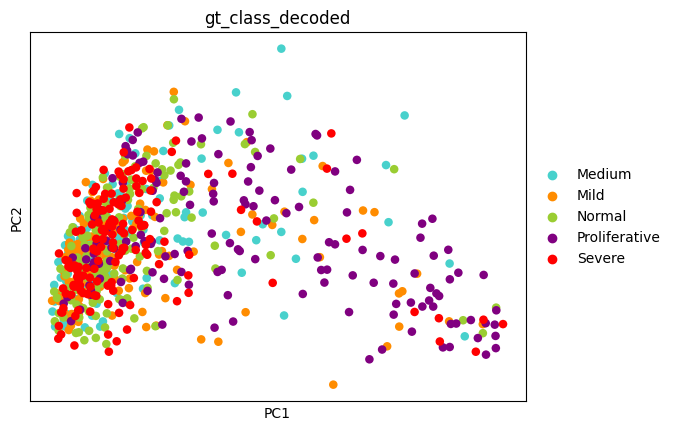

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


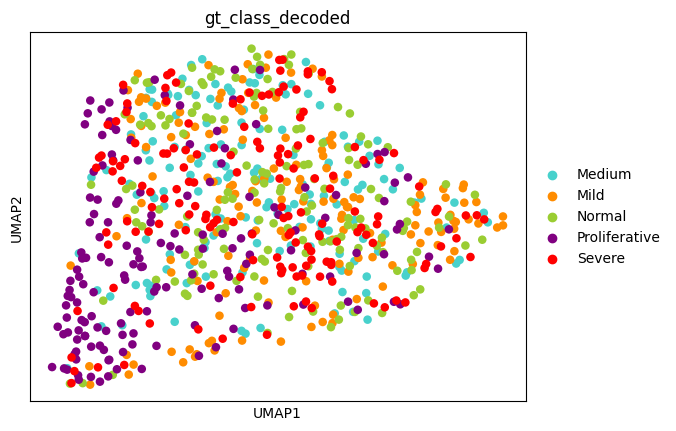

________________________________________________
________________________________________________
VanModel
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


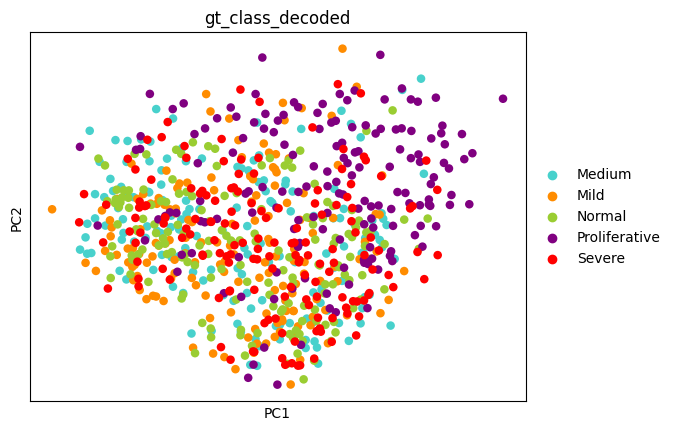

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


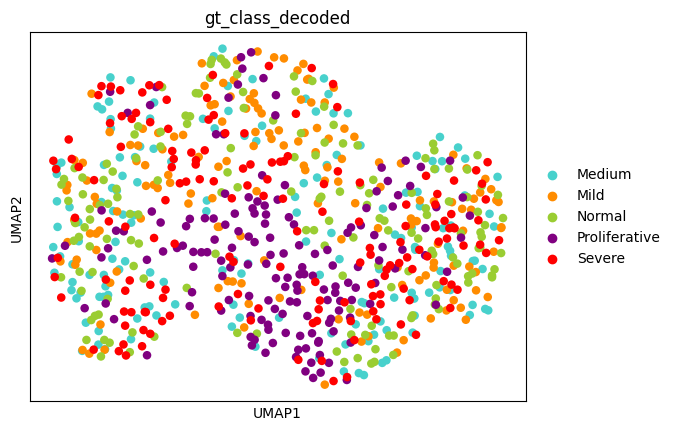

________________________________________________
________________________________________________
resnet18ImgNet
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


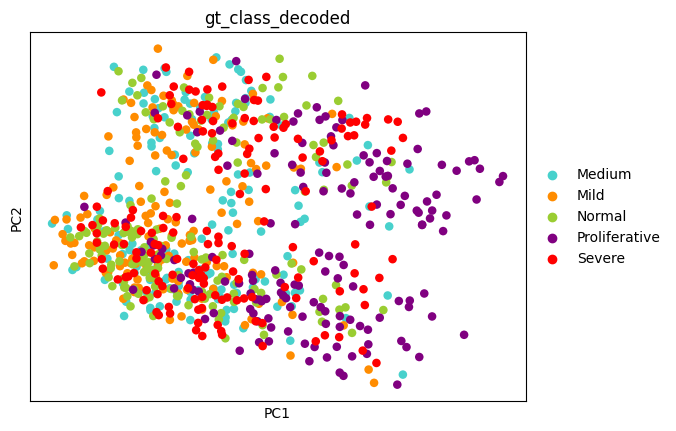

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


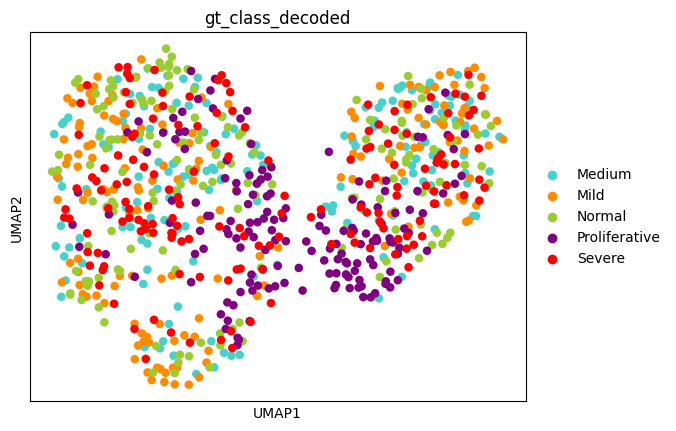

________________________________________________
________________________________________________
resnet34ImgNet
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


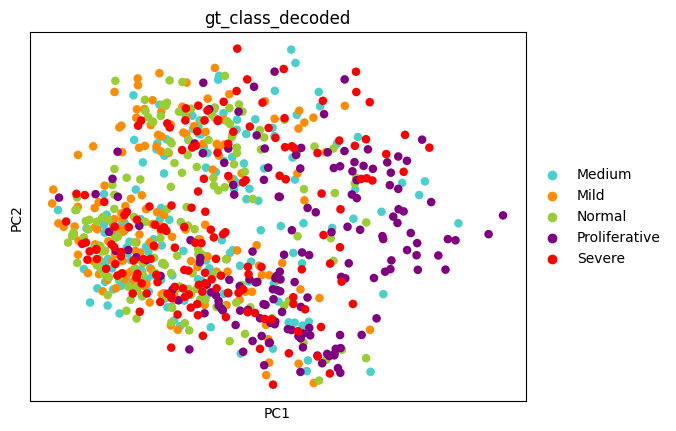

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


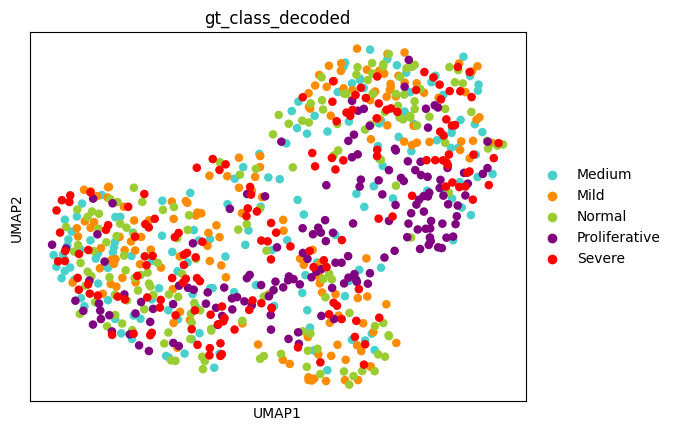

________________________________________________
________________________________________________
resnet50ImgNet
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


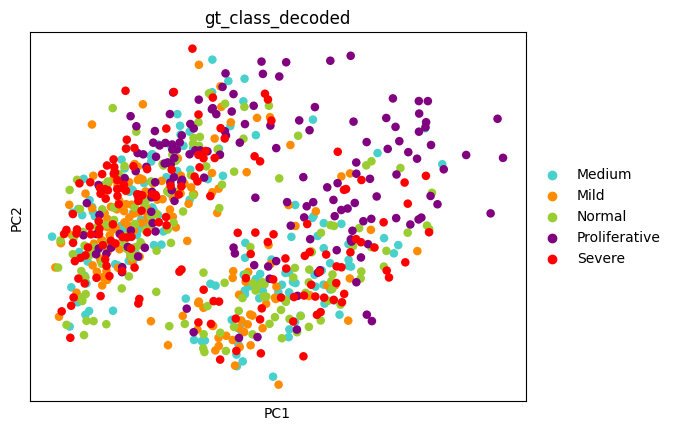

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


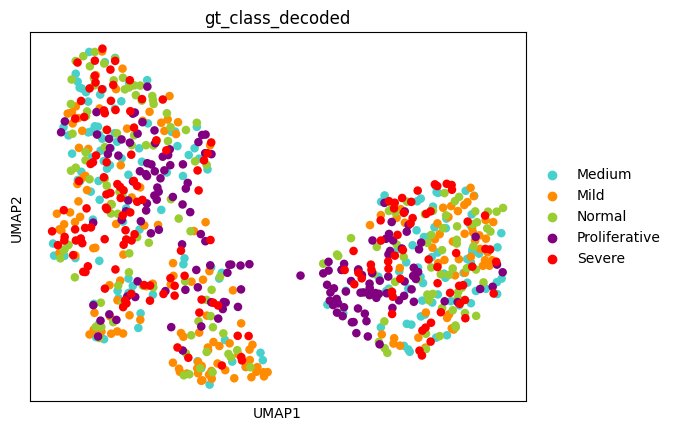

________________________________________________
________________________________________________
resnet50HistDINO
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


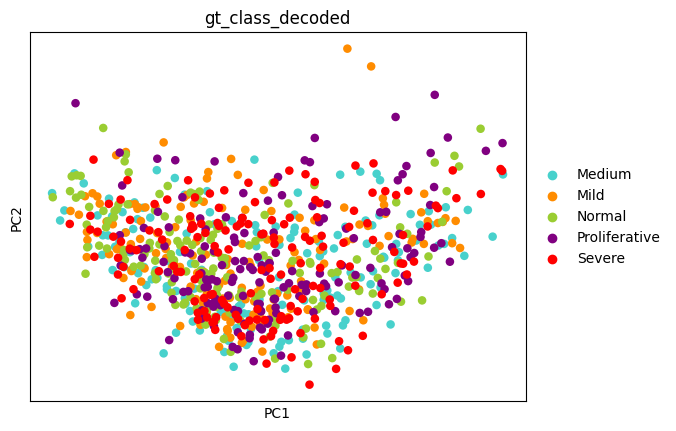

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


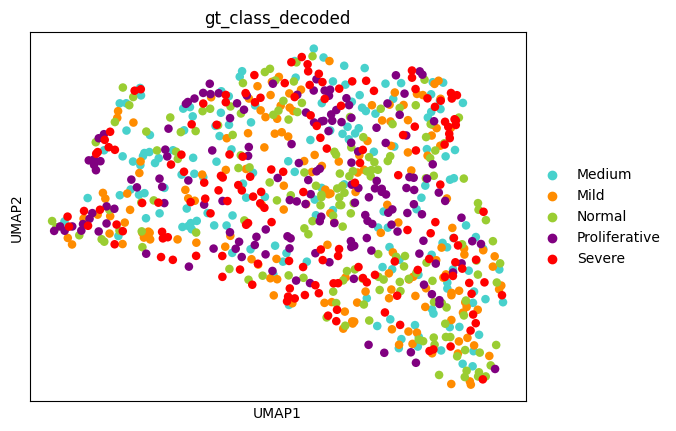

________________________________________________
________________________________________________
ViTHistDINO
gt_class_decoded
Medium           158
Mild             158
Normal           158
Proliferative    158
Severe           158
Name: count, dtype: int64


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


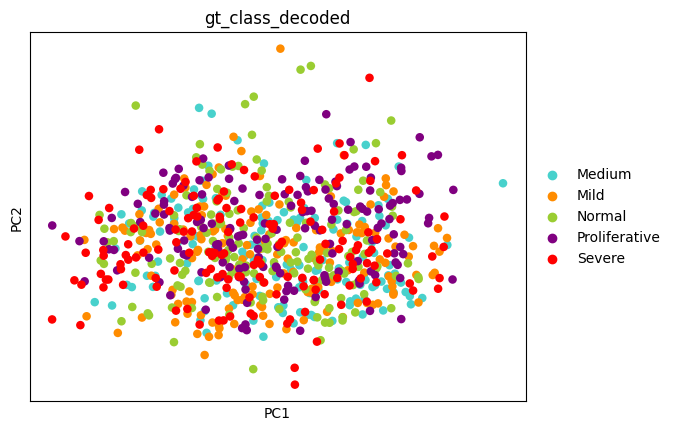

/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


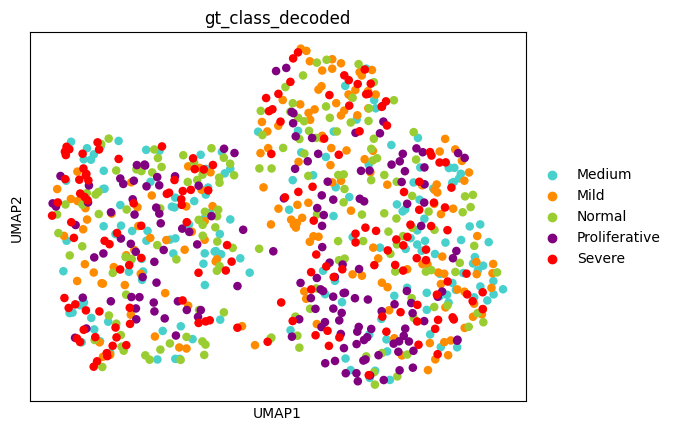

________________________________________________


In [22]:
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    print("________________________________________________")
    print(model)
    adata_dicts_undesampled[model] = show_adata(adata_dicts_undesampled[model])
    print("________________________________________________")

________________________________________________
ViTHF


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


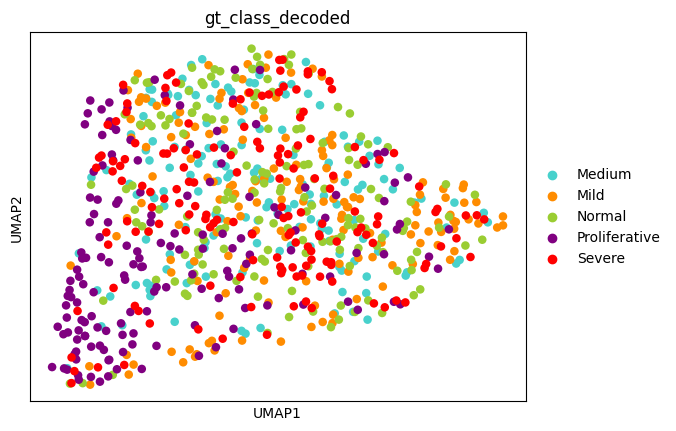

  0%|          | 0/790 [00:00<?, ?cell/s]

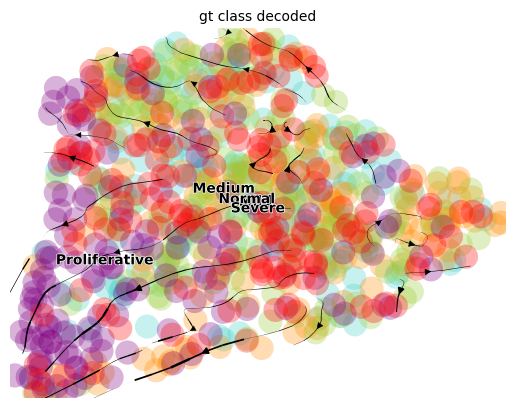

________________________________________________
________________________________________________
VanModel


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


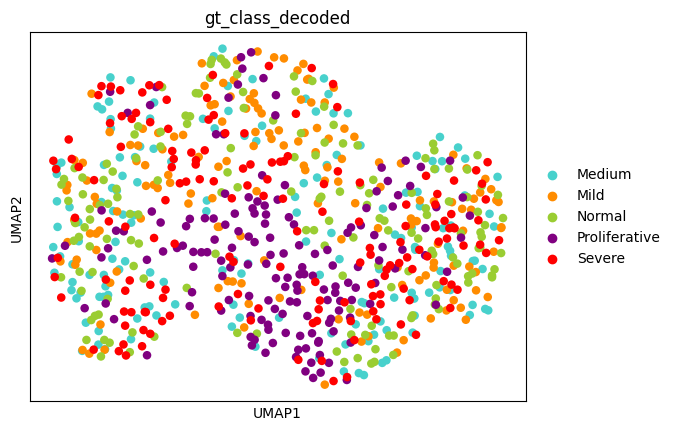

  0%|          | 0/790 [00:00<?, ?cell/s]

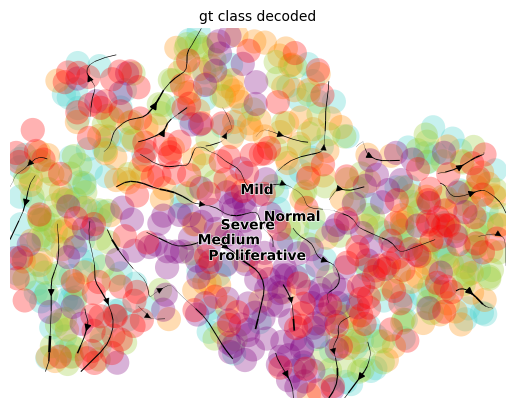

________________________________________________
________________________________________________
resnet18ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


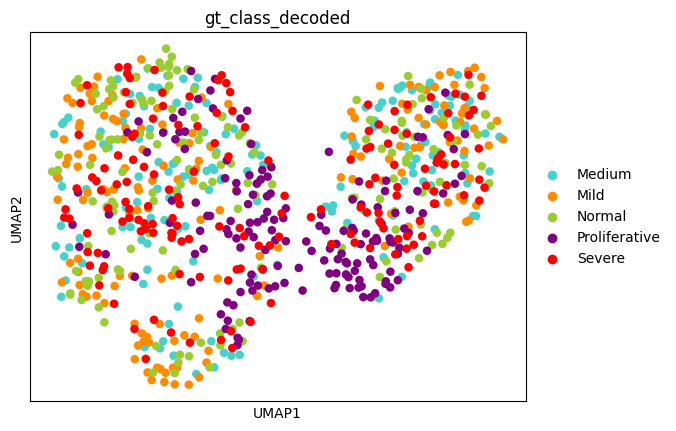

  0%|          | 0/790 [00:00<?, ?cell/s]

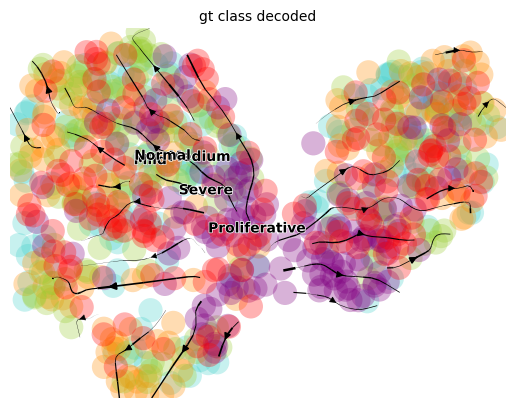

________________________________________________
________________________________________________
resnet34ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


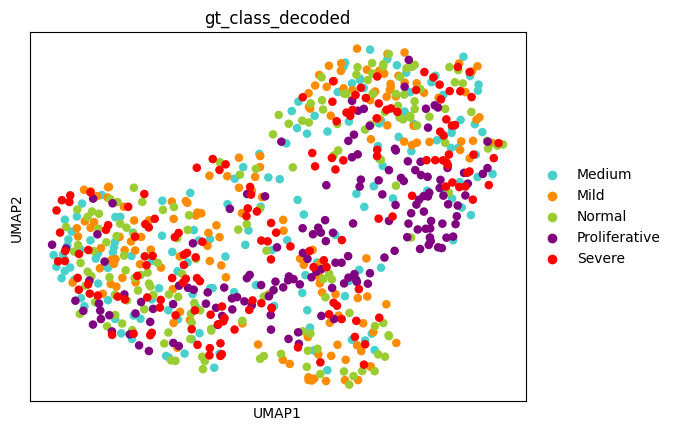

  0%|          | 0/790 [00:00<?, ?cell/s]

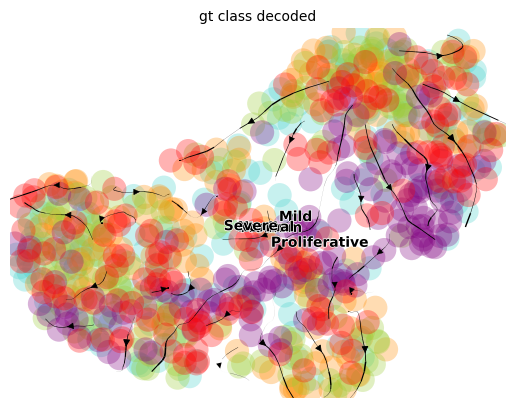

________________________________________________
________________________________________________
resnet50ImgNet


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


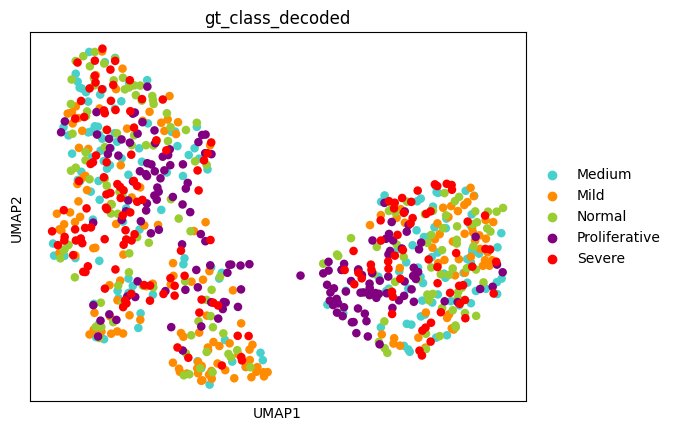

  0%|          | 0/790 [00:00<?, ?cell/s]

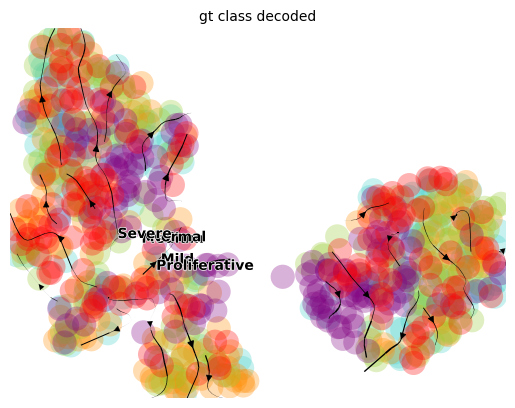

________________________________________________
________________________________________________
resnet50HistDINO


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


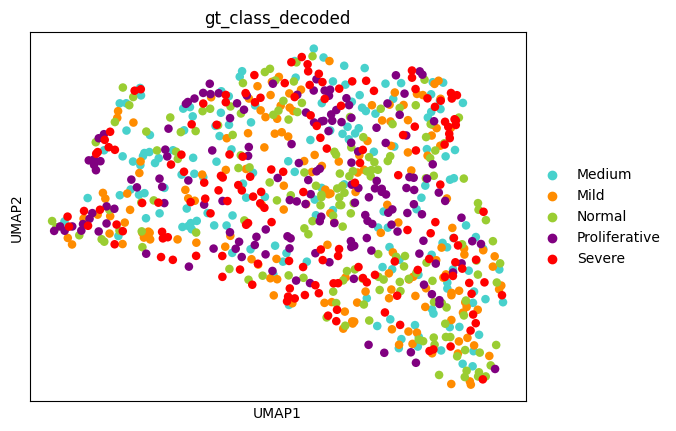

  0%|          | 0/790 [00:00<?, ?cell/s]

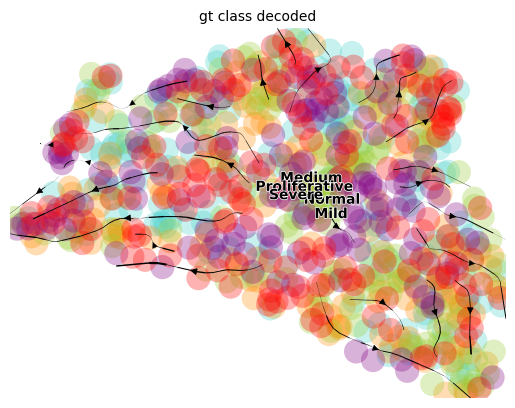

________________________________________________
________________________________________________
ViTHistDINO


/dss/dsshome1/02/di93zov/anaconda3/envs/ehrapy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


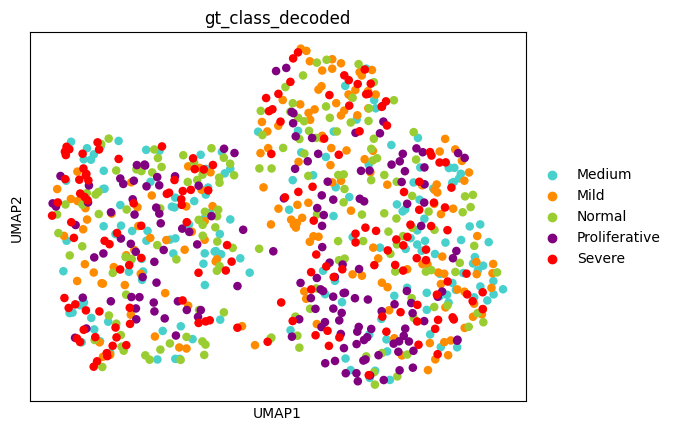

  0%|          | 0/790 [00:00<?, ?cell/s]

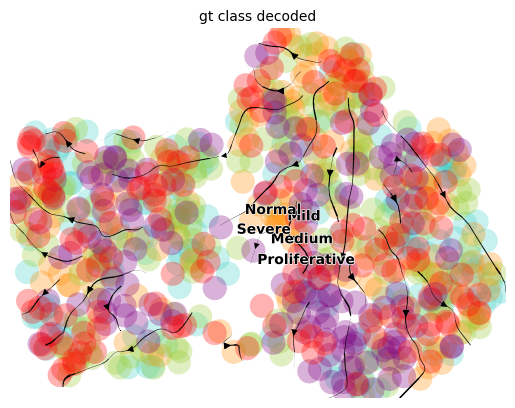

________________________________________________


In [23]:
for model in list(SpatialSSLModels.__members__.keys())[:7]:
    print("________________________________________________")
    print(model)
    show_adata_nonstandart(adata_dicts_undesampled[model])
    print("________________________________________________")

In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px


# Fit into the model
tsne = TSNE(n_components=3, random_state=0, verbose=1)
projections = tsne.fit_transform(adata.X)

In [ ]:
# Visualize
fig = px.scatter_3d(
    projections,
    x=0,
    y=1,
    z=2,
    color=label.label,
)
# fig.update_traces(marker_size=8)
fig.show()